## Title: A practical guide to generating and interpreting visualizations of shotgun proteomics data

#### Authors:
#### Pre-print:
#### Revision:

In [2]:
# Install all packages directly in the notebook
#!pip install pythonnet numpy pandas numba tqdm plotly

In [3]:
# import all necessary libraries
import logging
import pandas as pd
import numpy as np
from numba import njit
from tqdm import tqdm
from pyrawfilereader import RawFileReader

import plotly.graph_objects as go

# specify a configuration whether to display the Plotly logo in the toolbar and how to save the plot
config = {
    'displaylogo': False,
    'toImageButtonOptions': {
        'format': 'svg', # one of png, svg, jpeg, webp
        'filename': 'custom_image',
        'height': 500,
        'width': 700,
        'scale': 1 # Multiply title/legend/axis/canvas sizes by this factor
      }
}

The Thermo raw file is used from the [Project PXD010697 from ProteomeXchange](https://www.ebi.ac.uk/pride/archive/projects/PXD010697).

In [4]:
# specify a path to the Thermo .raw file
# TODO: add an option to download the file authomatically?
sample_path = "D:/vis_review/Data/PXD010697_circadian_clock/20170123_Qep6_ChRo_SA_collab_SYN_CT_phospho_1.raw"

In [5]:
# Necessary functions to read Thermo Raw file

def load_thermo_raw(
    raw_file,
    most_abundant=1000
):
    """
    Load a Thermo raw file and extract all spectra
    """

    rawfile = RawFileReader(raw_file)

    spec_indices = np.array(
        range(rawfile.FirstSpectrumNumber, rawfile.LastSpectrumNumber + 1)
    )

    scan_list = []
    rt_list = []
    mass_list = []
    int_list = []
    ms_list = []
    prec_mzs_list = []
    mono_mzs_list = []
    charge_list = []

    for i in tqdm((spec_indices)):
        try:
            ms_order = rawfile.GetMSOrderForScanNum(i)
            rt = rawfile.RTFromScanNum(i)
            

            if ms_order == 2:
                prec_mz = rawfile.GetPrecursorMassForScanNum(i, 0)

                mono_mz, charge = rawfile.GetMS2MonoMzAndChargeFromScanNum(i)
            else:
                prec_mz, mono_mz, charge = 0,0,0

            masses, intensity = rawfile.GetCentroidMassListFromScanNum(i)
            if ms_order == 2:
                masses, intensity = get_most_abundant(masses, intensity, most_abundant)

            scan_list.append(i)
            rt_list.append(rt)
            mass_list.append(np.array(masses))
            int_list.append(np.array(intensity, dtype=np.int64))
            ms_list.append(ms_order)
            prec_mzs_list.append(prec_mz)
            mono_mzs_list.append(mono_mz)
            charge_list.append(charge)
        except KeyboardInterrupt as e:
            raise e
        except SystemExit as e:
            raise e
        except Exception as e:
            logging.info(f"Bad scan={i} in raw file '{raw_file}'")

    scan_list_ms1 = [scan_list[i] for i, _ in enumerate(ms_list) if _ == 1]
    rt_list_ms1 = [rt_list[i] for i, _ in enumerate(ms_list) if _ == 1]
    mass_list_ms1 = [mass_list[i] for i, _ in enumerate(ms_list) if _ == 1]
    int_list_ms1 = [int_list[i] for i, _ in enumerate(ms_list) if _ == 1]
    ms_list_ms1 = [ms_list[i] for i, _ in enumerate(ms_list) if _ == 1]

    scan_list_ms2 = [scan_list[i] for i, _ in enumerate(ms_list) if _ == 2]
    rt_list_ms2 = [rt_list[i] for i, _ in enumerate(ms_list) if _ == 2]
    mass_list_ms2 = [mass_list[i] for i, _ in enumerate(ms_list) if _ == 2]
    int_list_ms2 = [int_list[i] for i, _ in enumerate(ms_list) if _ == 2]
    ms_list_ms2 = [ms_list[i] for i, _ in enumerate(ms_list) if _ == 2]
    mono_mzs2 = [mono_mzs_list[i] for i, _ in enumerate(ms_list) if _ == 2]
    charge2 = [charge_list[i] for i, _ in enumerate(ms_list) if _ == 2]

    prec_mass_list2 = [
        calculate_mass(mono_mzs_list[i], charge_list[i])
        for i, _ in enumerate(ms_list)
        if _ == 2
    ]

    check_sanity(mass_list)

    data = {}
#     data['scan_list'] = np.array(scan_list)
#     data["rt_list"] = np.array(rt_list)
#     data['ms_list'] = np.array(ms_list)
#     data['int_list'] = np.array(int_list)
    
    data["scan_list_ms1"] = np.array(scan_list_ms1)
    data["rt_list_ms1"] = np.array(rt_list_ms1)
    data["mass_list_ms1"] = np.array(mass_list_ms1, dtype=object)
    data["int_list_ms1"] = np.array(int_list_ms1, dtype=object)
    data["ms_list_ms1"] = np.array(ms_list_ms1)

    data["scan_list_ms2"] = np.array(scan_list_ms2)
    data["rt_list_ms2"] = np.array(rt_list_ms2)
    data["mass_list_ms2"] = mass_list_ms2
    data["int_list_ms2"] = int_list_ms2
    data["ms_list_ms2"] = np.array(ms_list_ms2)
    data["prec_mass_list2"] = np.array(prec_mass_list2)
    data["mono_mzs2"] = np.array(mono_mzs2)
    data["charge_ms2"] = np.array(charge2)

    rawfile.Close()
    return data

def get_most_abundant(
    mass, 
    intensity, 
    n_max
):
    """
    Returns the n_max most abundant peaks of a spectrum.
    Setting `n_max` to -1 returns all peaks.
    """
    if n_max == -1:
        return mass, intensity
    if len(mass) < n_max:
        return mass, intensity
    else:
        sortindex = np.argsort(intensity)[::-1][:n_max]
        sortindex.sort()

    return mass[sortindex], intensity[sortindex]

@njit
def calculate_mass(
    mono_mz, 
    charge
):
    """
    Calculate the precursor mass from mono mz and charge
    """
    M_PROTON = 1.00727646687
    prec_mass = mono_mz * abs(charge) - charge * M_PROTON

    return prec_mass

def check_sanity(
    mass_list
):
    """
    Sanity check for mass list to make sure the masses are sorted
    """
    if not all(
        mass_list[0][i] <= mass_list[0][i + 1] for i in range(len(mass_list[0]) - 1)
    ):
        raise ValueError("Masses are not sorted.")

In [6]:
# upload the thermo raw file
data = load_thermo_raw(sample_path)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54493/54493 [01:31<00:00, 597.65it/s]


In [7]:
# df = pd.DataFrame({'scan': data['scan_list'], 
#                     'RT': data['rt_list'],
#                    'intensity': data['int_list'],
#                     'order': data['ms_list'],})

In [8]:
# save ms1 and ms2 data separately 
df_ms1 = pd.DataFrame({'scan': data['scan_list_ms1'], 
                    'RT': data['rt_list_ms1'],
                   'intensity': data['int_list_ms1'],
                    'order': 'ms1'})
df_ms2 = pd.DataFrame({'scan': data['scan_list_ms2'], 
                    'RT': data['rt_list_ms2'],
                   'intensity': data['int_list_ms2'],
                    'order': 'ms2'})

In [9]:
# combine two dataframes
df = pd.concat([df_ms1, df_ms2])
df.sort_values('RT', inplace=True)

In [10]:
# calculate summed and max intensity per each scan
df['summed_intensity'] = df.intensity.apply(lambda x: sum(x))
df['max_intensity'] = df.intensity.apply(lambda x: max(x))

In [11]:
# df[df.scan == 31068]
# df.loc[df.scan == 31066, 'intensity'].values[0].sum()

In [12]:
def plot_tic(
    df: pd.DataFrame, 
    title: str, 
    width: int = 900,
    height: int = 500
):
    """Create a total ion chromatogram (TIC) and Base Peak chromatogram (BPI) for the MS1 data.

    Parameters
    ----------
    df : pandas Dataframe
        A table with the extracted MS1 data.
    title : str
        The title of the plot.
        Default is False
    width : int
        The width of the plot.
        Default is 1000.
    height : int
        The height of the plot.
        Default is 320.

    Returns
    -------
    a Plotly line plot
        The line plot containing TIC and BPI for MS1 data of the provided dataset.
    """
    fig = go.Figure()
    
    total_ion_col = ['RT', 'summed_intensity']
    base_peak_col = ['RT', 'max_intensity']
    
    for chrom_type in ['TIC MS1', 'BPI MS1']:
        if chrom_type == 'TIC MS1':
            data = df[total_ion_col]
        elif chrom_type == 'BPI MS1':
            data = df[base_peak_col]
        fig.add_trace(
            go.Scatter(
                x=data.iloc[:, 0],
                y=data.iloc[:, 1],
                name=chrom_type,
                hovertemplate='<b>RT:</b> %{x};<br><b>Intensity:</b> %{y}.',
            )
        )
    
    fig.update_layout(
        title=dict(
            text=title,
            font=dict(
                size=16,
            ),
            x=0.5,
            xanchor='center',
            yanchor='top'
        ),
        xaxis=dict(
            title='RT, min',
            titlefont_size=14,
            tickmode = 'auto',
            tickfont_size=14,
        ),
        yaxis=dict(
            title='Intensity',
        ),
        legend=dict(
            orientation="h",
            yanchor="bottom",
            y=1.02,
            xanchor="right",
            x=1
        ),
        legend_title_text='Select:',
        hovermode="x",
        template="plotly_white",
        width=width,
        height=height
    )

    fig.update_xaxes(range=[0, df.RT.max()])
    return fig
    

## Figure 1 A/B: TIC and BPI

In [ ]:
!conda install -c plotly plotly-orca

In [63]:
plot_tic(df[df.order == 'ms1'], 'Chromatogram').show('svg', config=config)

ValueError: 
The orca executable is required to export figures as static images,
but it could not be found on the system path.

Searched for executable 'orca' on the following path:
    C:\Users\voytik\Anaconda3\envs\alphaviz_updated
    C:\Users\voytik\Anaconda3\envs\alphaviz_updated\Library\mingw-w64\bin
    C:\Users\voytik\Anaconda3\envs\alphaviz_updated\Library\usr\bin
    C:\Users\voytik\Anaconda3\envs\alphaviz_updated\Library\bin
    C:\Users\voytik\Anaconda3\envs\alphaviz_updated\Scripts
    C:\Users\voytik\Anaconda3\envs\alphaviz_updated\bin
    C:\Program Files\Microsoft MPI\Bin
    C:\Program Files (x86)\Common Files\Oracle\Java\javapath
    C:\WINDOWS\system32
    C:\WINDOWS
    C:\WINDOWS\System32\Wbem
    C:\WINDOWS\System32\WindowsPowerShell\v1.0
    C:\WINDOWS\System32\OpenSSH
    C:\Program Files\Microsoft VS Code\bin
    C:\Program Files\PuTTY
    C:\Program Files\dotnet
    C:\Program Files\Git\cmd
    C:\Windows\System32
    C:\Program Files\OpenMS-2.4.0-nightly-2019-01-26\bin
    C:\Program Files\OpenMS-2.4.0-nightly-2019-01-26\share\OpenMS\THIRDPARTY\Comet
    C:\Program Files\OpenMS-2.4.0-nightly-2019-01-26\share\OpenMS\THIRDPARTY\crux
    C:\Program Files\OpenMS-2.4.0-nightly-2019-01-26\share\OpenMS\THIRDPARTY\Fido
    C:\Program Files\OpenMS-2.4.0-nightly-2019-01-26\share\OpenMS\THIRDPARTY\LuciPHOr2
    C:\Program Files\OpenMS-2.4.0-nightly-2019-01-26\share\OpenMS\THIRDPARTY\MaRaCluster
    C:\Program Files\OpenMS-2.4.0-nightly-2019-01-26\share\OpenMS\THIRDPARTY\MSGFPlus
    C:\Program Files\OpenMS-2.4.0-nightly-2019-01-26\share\OpenMS\THIRDPARTY\MyriMatch
    C:\Program Files\OpenMS-2.4.0-nightly-2019-01-26\share\OpenMS\THIRDPARTY\OMSSA
    C:\Program Files\OpenMS-2.4.0-nightly-2019-01-26\share\OpenMS\THIRDPARTY\Percolator
    C:\Program Files\OpenMS-2.4.0-nightly-2019-01-26\share\OpenMS\THIRDPARTY\pwiz-bin
    C:\Program Files\OpenMS-2.4.0-nightly-2019-01-26\share\OpenMS\THIRDPARTY\Sirius
    C:\Program Files\OpenMS-2.4.0-nightly-2019-01-26\share\OpenMS\THIRDPARTY\SpectraST
    C:\Program Files\OpenMS-2.4.0-nightly-2019-01-26\share\OpenMS\THIRDPARTY\XTandem
    C:\Program Files\poppler-0.68.0\bin
    C:\Program Files\CMake\bin
    C:\Program Files\TortoiseSVN\bin
    C:\Program Files\Microsoft SQL Server\130\Tools\Binn
    C:\Program Files\quandenser-v0-01
    C:\Program Files (x86)\Common Files\Bruker Daltonik\NTDS\Bin
    C:\Users\voytik\AppData\Local\Continuum\anaconda3
    C:\Users\voytik\AppData\Local\Continuum\anaconda3\condabin
    C:\Users\voytik\AppData\Local\Continuum\anaconda3\Scripts
    C:\Program Files\Common Files\Bruker Daltonik\DLLs
    C:\Program Files\Docker\Docker\resources\bin
    C:\ProgramData\DockerDesktop\version-bin
    C:\Users\voytik\Anaconda3
    C:\Users\voytik\Anaconda3\Library\mingw-w64\bin
    C:\Users\voytik\Anaconda3\Library\usr\bin
    C:\Users\voytik\Anaconda3\Library\bin
    C:\Users\voytik\Anaconda3\Scripts
    D:\ncbi_blast\blast-2.10.1+\bin
    C:\Users\voytik\AppData\Local\Microsoft\WindowsApps
    C:\Users\voytik\AppData\Roaming\npm
    C:\Users\voytik\Anaconda
    C:\Users\voytik\Anaconda\Scripts
    C:\Users\voytik\AppData\Local\Programs\EmEditor
    C:\Program Files\R\R-3.6.3\bin
    C:\Program Files\Redis
    C:\Users\voytik\AppData\Local\Microsoft\WindowsApps
    C:\Users\voytik\AppData\Local\atom\bin
    C:\Users\voytik\Anaconda3\lib
    .
    C:\Users\voytik\AppData\Roaming\Python\Python38\site-packages\pywin32_system32
    C:\Users\voytik\Anaconda3\envs\alphaviz_updated\lib\site-packages\llvmlite\binding

If you haven't installed orca yet, you can do so using conda as follows:

    $ conda install -c plotly plotly-orca

Alternatively, see other installation methods in the orca project README at
https://github.com/plotly/orca

After installation is complete, no further configuration should be needed.

If you have installed orca, then for some reason plotly.py was unable to
locate it. In this case, set the `plotly.io.orca.config.executable`
property to the full path of your orca executable. For example:

    >>> plotly.io.orca.config.executable = '/path/to/orca'

After updating this executable property, try the export operation again.
If it is successful then you may want to save this configuration so that it
will be applied automatically in future sessions. You can do this as follows:

    >>> plotly.io.orca.config.save()

If you're still having trouble, feel free to ask for help on the forums at
https://community.plot.ly/c/api/python


## Figure 1 C: MS1 feature map

In [16]:
lst_col = 'intensity'
ms1_long = pd.DataFrame({col:np.repeat(df_ms1[col].values, df_ms1[lst_col].str.len()) for col in df_ms1.columns.drop(lst_col)})
ms1_long['mz'] = np.concatenate(data['mass_list_ms1'])
ms1_long['intensity'] = np.concatenate(data['int_list_ms1'])
ms1_long.head()

,scan,RT,order,mz,intensity
0,1,0.002888,ms1,339.826355,397
1,1,0.002888,ms1,353.999969,408
2,1,0.002888,ms1,393.317078,431
3,1,0.002888,ms1,438.728851,445
4,1,0.002888,ms1,509.966522,395


In [ ]:
# !pip install datashader colorcet 

In [17]:
import datashader as ds
cvs = ds.Canvas(plot_width=1000, plot_height=320)
agg = cvs.points(ms1_long, x='RT', y='mz', agg=getattr(ds, 'sum')('intensity'))
from colorcet import fire
import datashader.transfer_functions as tf
img = tf.shade(agg, cmap=fire)[::-1]

import plotly.express as px
# Trick to create rapidly a figure with mapbox axes
fig = px.imshow(img, origin='lower')#.to_pil()
fig.update_layout(
    title=dict(
        text=f"Heatmap",
        font=dict(
            size=16,
#                 color="RebeccaPurple"
        ),
        y=0.91,
        x=0.5,
        xanchor='center',
        yanchor='top'
    ),
)
fig.show()

## Figure 1 D: m/z vs. IM heatmap

The Bruker raw file is used from the [Project PXD017703 from ProteomeXchange](https://www.ebi.ac.uk/pride/archive/projects/PXD017703).

To read the raw TIMS-TOF data we will use a recently published [AlphaTims package](https://github.com/MannLabs/alphatims).

In [35]:
# !pip install alphatims holoviews

In [42]:
import alphatims.bruker
# import alphaviz.plotting
import holoviews as hv
from holoviews import opts
from holoviews.operation.datashader import dynspread, rasterize, shade

In [59]:
# it will be inside alphaviz package
def plot_heatmap(
    df: pd.DataFrame,
    x_axis_label: str = 'm/z, Th',
    y_axis_label: str = 'Inversed IM, V·s·cm\u207B\u00B2',
    z_axis_label: str = "Intensity",
    title: str = "",
    width: int = 550,
    height: int = 450,
    background_color: str = "black",
    precursor_color: str = 'white',
    precursor_size: int = 15,
    colormap: str = 'fire',
    **kwargs,
):
    labels = {
        'm/z, Th': "mz_values",
        'RT, min': "rt_values",
        'Inversed IM, V·s·cm\u207B\u00B2': "mobility_values",
        'Intensity': "intensity_values",
    }
    x_dimension = labels[x_axis_label]
    y_dimension = labels[y_axis_label]
    z_dimension = labels[z_axis_label]

    df["rt_values"] /= 60

    def hook(plot, element):
        plot.handles['layout']['xaxis']['gridcolor'] = background_color
        plot.handles['layout']['yaxis']['gridcolor'] = background_color

    opts_ms1=dict(
        width=width,
        height=height,
        title=title,
        xlabel=x_axis_label,
        ylabel=y_axis_label,
        bgcolor=background_color,
        hooks=[hook],
    )
    dmap = hv.DynamicMap(
        hv.Points(
            df,
            [x_dimension, y_dimension],
            z_dimension
        )
    )
    agg = rasterize(
        dmap,
        width=width,
        height=height,
        aggregator='sum'
    )
    fig = dynspread(
        shade(
            agg,
            cmap=colormap
        )
    ).opts(plot=opts_ms1)

    return fig

In [25]:
file_path = '../Data/PXD017703_diaPASEF/20200428_Evosep_60SPD_SG06-16_MLHeLa_200ng_py8_S3-A6_1_2452.d'

In [26]:
raw_data = alphatims.bruker.TimsTOF(file_path)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11872/11872 [00:21<00:00, 557.93it/s]


:DynamicMap   []
   :RGB   [mz_values,mobility_values]   (R,G,B,A)
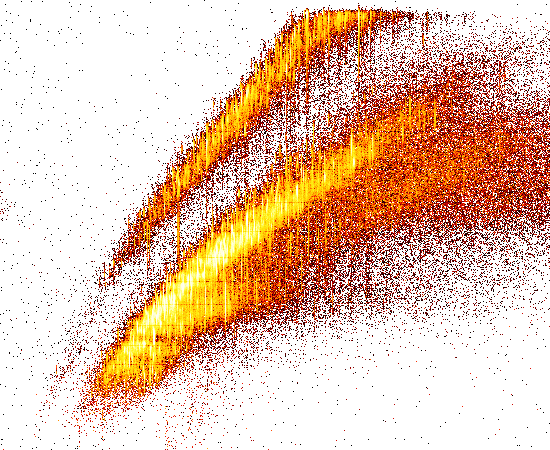

In [61]:
plot_heatmap(raw_data[6004], title='Heatmap')